In [1]:
print('jamee')

jamee


In [2]:
pip install tensorflow


Note: you may need to restart the kernel to use updated packages.


In [6]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras as keras
from tensorflow.keras import regularizers
from tensorflow.keras.initializers import GlorotNormal
from tensorflow.keras.metrics import TruePositives, FalsePositives, TrueNegatives, FalseNegatives, BinaryAccuracy, Precision, Recall, AUC
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import time
import cv2
import pathlib
import matplotlib as mpl
import seaborn as sns

In [4]:
img_width = 448
img_height = 448
batch_size = 64
color = 3
dataset_folder = "data_dataset_fyp"
classes_name = ['Ajwa', 'Galaxy', 'Medjool', 'Meneifi', 'Nabtat Ali', 'Rutab', 'Shaishe', 'Sokari', 'Sugaey']


In [5]:
dataset = pathlib.Path(dataset_folder)


In [6]:
def directory_dataset(dataset):
  folders = []
  for i in dataset.iterdir():
    if i.is_dir():
      folders.append(i)
  return folders

folders = directory_dataset(dataset)

print(folders)

[WindowsPath('data_dataset_fyp/Ajwa'), WindowsPath('data_dataset_fyp/Galaxy'), WindowsPath('data_dataset_fyp/Medjool'), WindowsPath('data_dataset_fyp/Meneifi'), WindowsPath('data_dataset_fyp/Nabtat Ali'), WindowsPath('data_dataset_fyp/Rutab'), WindowsPath('data_dataset_fyp/Shaishe'), WindowsPath('data_dataset_fyp/Sokari'), WindowsPath('data_dataset_fyp/Sugaey')]


number of all images in dataset: 1658
data_dataset_fyp\Ajwa: 175
data_dataset_fyp\Galaxy: 190
data_dataset_fyp\Medjool: 135
data_dataset_fyp\Meneifi: 232
data_dataset_fyp\Nabtat Ali: 177
data_dataset_fyp\Rutab: 146
data_dataset_fyp\Shaishe: 171
data_dataset_fyp\Sokari: 264
data_dataset_fyp\Sugaey: 168
data_dataset_fyp\Ajwa\Ajwa Date (1).JPG


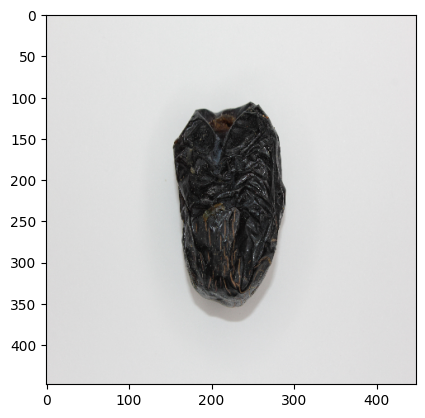

data_dataset_fyp\Galaxy\Galaxy Date (1).JPG


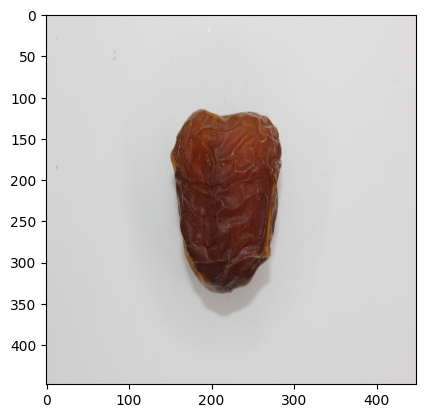

data_dataset_fyp\Medjool\Medjool Date (1).JPG


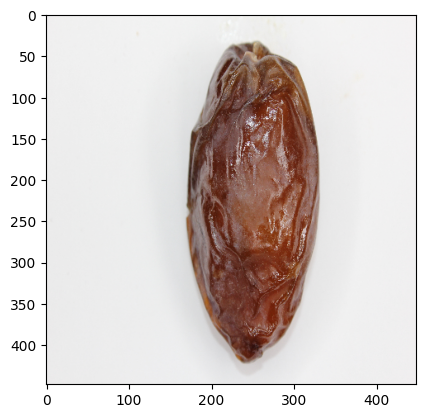

data_dataset_fyp\Meneifi\Meneifi Date (1).JPG


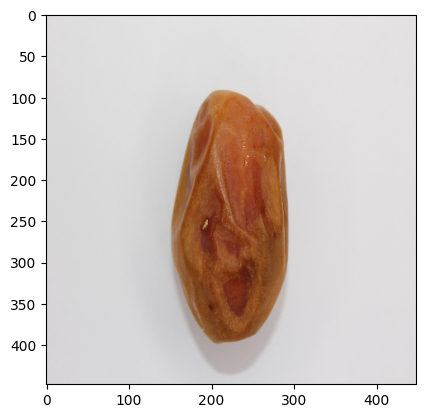

data_dataset_fyp\Nabtat Ali\Nabtat Ali Date (1).JPG


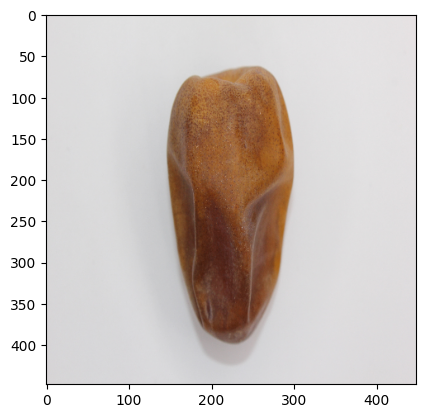

data_dataset_fyp\Rutab\Rutab Date (1).JPG


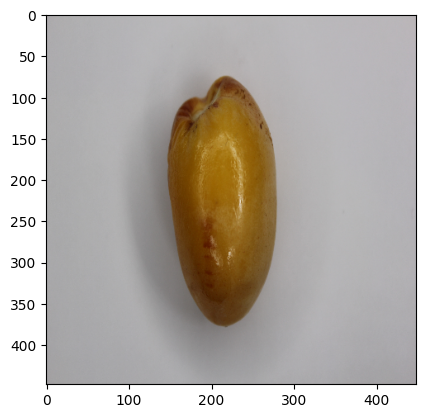

data_dataset_fyp\Shaishe\Shaishe Date (1).JPG


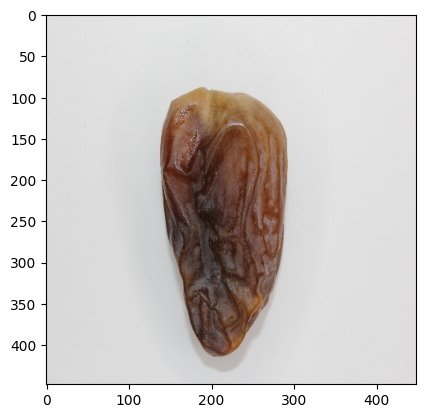

data_dataset_fyp\Sokari\Sokari Date (1).JPG


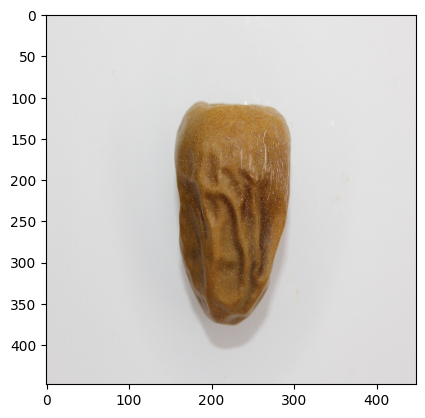

data_dataset_fyp\Sugaey\Sugaey Date (1).JPG


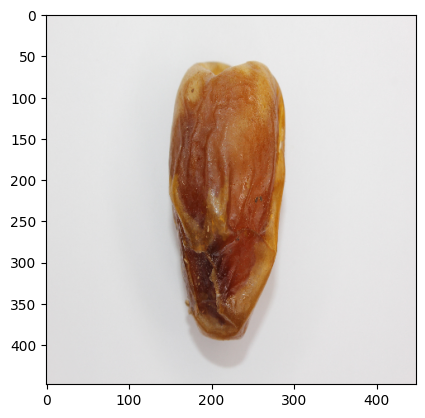

In [7]:
def number_of_images_in_dataset(dataset):
  images = list(dataset.glob("*/*.*"))
  return len(images)
print("number of all images in dataset: {}".format(number_of_images_in_dataset(dataset)))

def number_of_images_in_each_folder(folders):
  for i in folders:
    str_ = "{}: {}".format(i, len(list(pathlib.Path(i).glob("*.*"))))
    print(str_)

number_of_images_in_each_folder(folders)

def show_single_image_in_each_directory(folders):
  for i in folders:
    images = list(pathlib.Path(i).glob("*.*"))
    print(images[0])
    img = cv2.imread(os.path.join(images[0]))
    img = cv2.resize(img, (img_width, img_height))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()
show_single_image_in_each_directory(folders)

In [8]:
def Blurring(image):
  image = cv2.medianBlur(image,5)
  return image
def image_generator(dataset_folder):
  datagen = ImageDataGenerator( rescale=1/255, validation_split=0.1,vertical_flip=True ,horizontal_flip=True,width_shift_range=0.2,height_shift_range=0.2,
                               rotation_range = 5, shear_range = 0.02,zoom_range = 0.02, preprocessing_function = Blurring)
  train_generator = datagen.flow_from_directory(
      dataset_folder,
      target_size=(img_height, img_width),
      batch_size=batch_size,
      class_mode='categorical',
      shuffle=True,
      subset='training')
  validation_generator = datagen.flow_from_directory(
      dataset_folder,
      target_size=(img_height, img_width),
      batch_size= batch_size,
      shuffle=False,
      class_mode='categorical',
      subset='validation')
  return [train_generator, validation_generator]

[training_dataset, validation_dataset] = image_generator(dataset)


Found 1496 images belonging to 9 classes.
Found 162 images belonging to 9 classes.


In [9]:
from PIL import Image

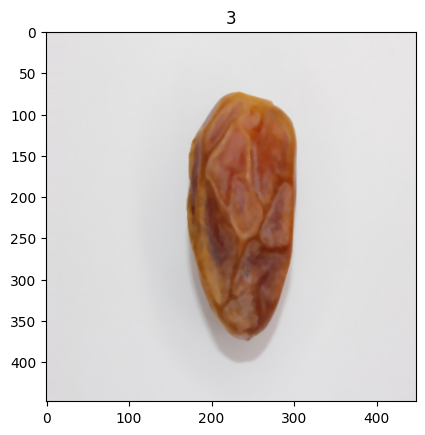

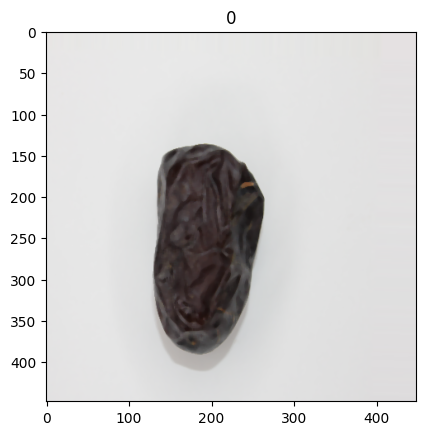

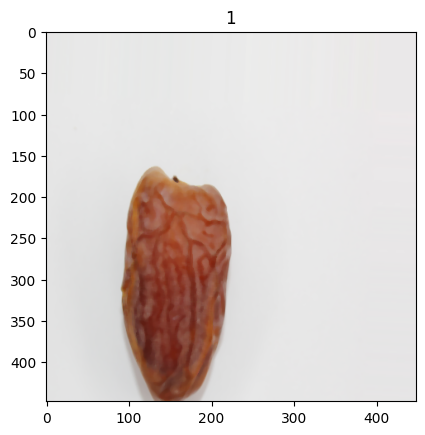

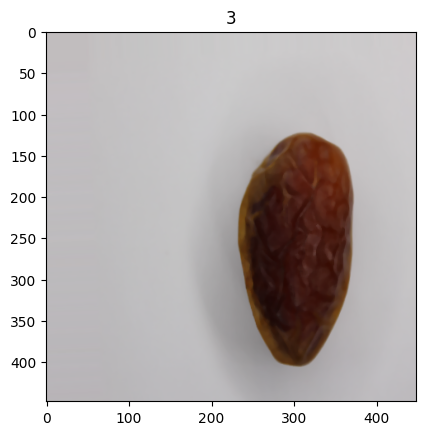

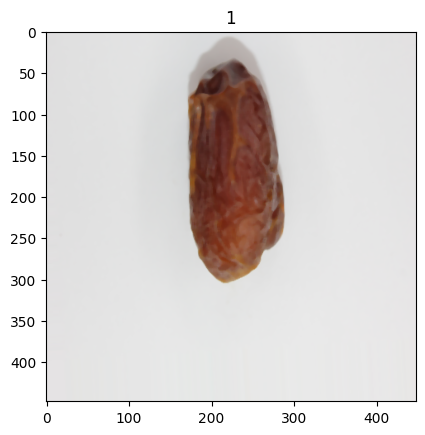

...

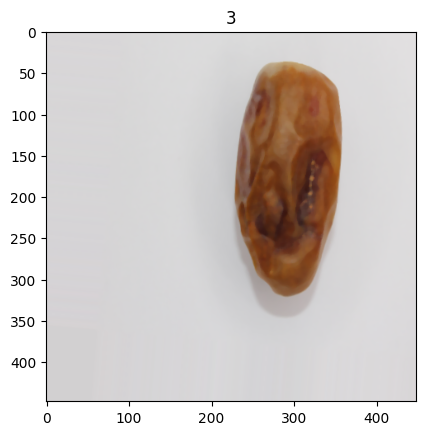

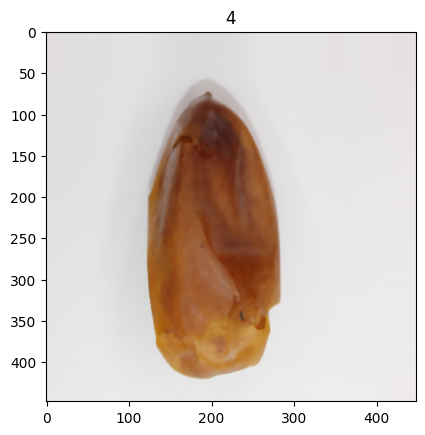

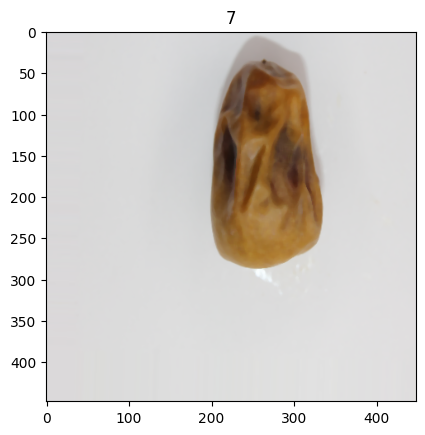

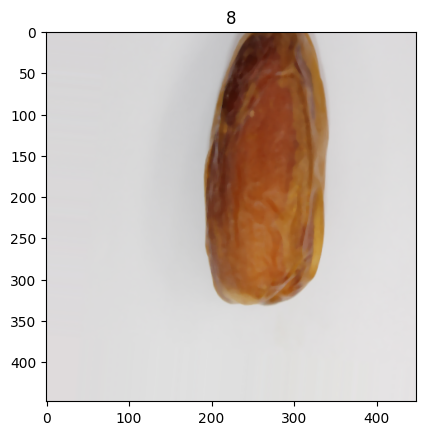

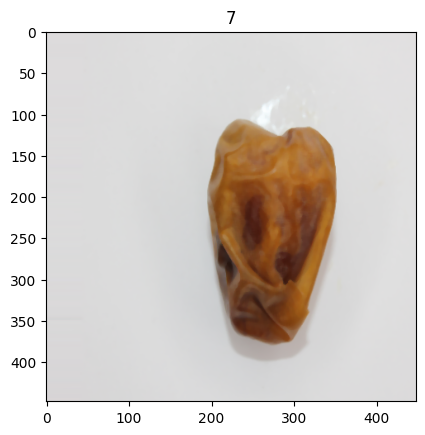

In [10]:
def show_one_batch(data_generator):
    single_batch = data_generator.next()
    images = single_batch[0]
    labels = single_batch[1]
    for i in range(batch_size):
        plt.imshow(images[i])
        plt.title(np.argmax(labels[i]))  # Convert label to string
        plt.show()

show_one_batch(training_dataset)


In [11]:
"""#Transfer Learning using mobilenet_v2"""

mo = keras.applications.mobilenet_v2
conv_model = mo.MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, color))
the_model = keras.layers.Dropout(0.2)(conv_model.output)
the_model = keras.layers.Flatten()(the_model)
the_model = keras.layers.Dense(256, activation='relu', kernel_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
the_model = keras.layers.Dropout(0.2)(the_model)
the_model = keras.layers.Dense(128, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
the_model = keras.layers.Dropout(0.2)(the_model)
the_model = keras.layers.Dense(64, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
the_model = keras.layers.Dropout(0.2)(the_model)
the_model = keras.layers.Dense(32, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
the_model = keras.layers.Dropout(0.2)(the_model)
the_model = keras.layers.Dense(16, activation='relu',  kernel_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
the_model = keras.layers.Dropout(0.2)(the_model)
predictions = keras.layers.Dense(len(classes_name), activation='softmax', activity_regularizer=tf.keras.regularizers.L2(0.01))(the_model)
mo = keras.models.Model(inputs=conv_model.input, outputs=predictions)
for layer in mo.layers[:151]:
    layer.trainable = False
for layer in mo.layers[151:]:
    layer.trainable = True
mo.summary()






Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 448, 448, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 224, 224, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 224, 224, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 224, 224, 32)         0         ['bn_Conv1[0][0]']     

In [12]:
len(mo.layers)

mo.layers[151:]

In [13]:
me = [
      TruePositives(name='tp'),
      FalsePositives(name='fp'),
      TrueNegatives(name='tn'),
      FalseNegatives(name='fn'),
      BinaryAccuracy(name='accuracy'),
      Precision(name='precision'),
      Recall(name='recall'),
      AUC(name='auc')
]

base_learning_rate = 0.01
mo.compile(optimizer=tf.keras.optimizers.Adamax(learning_rate=base_learning_rate),
              loss="categorical_crossentropy",
              metrics=me)

call_1 = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=30, restore_best_weights=True)
callbacks = [call_1]


In [14]:
epochs=300
history = mo.fit(
  training_dataset,
  epochs=epochs,
  callbacks = callbacks,
  batch_size = batch_size
)

Epoch 1/300

24/24 [==============================] - 299s 13s/step - loss: 137.9428 - tp: 41.0000 - fp: 343.0000 - tn: 11625.0000 - fn: 1455.0000 - accuracy: 0.8665 - precision: 0.1068 - recall: 0.0274 - auc: 0.5258
Epoch 2/300
24/24 [==============================] - 287s 12s/step - loss: 80.0491 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 11968.0000 - fn: 1496.0000 - accuracy: 0.8889 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5281
Epoch 3/300
24/24 [==============================] - 286s 12s/step - loss: 42.8204 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 11968.0000 - fn: 1496.0000 - accuracy: 0.8889 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5394
Epoch 4/300
24/24 [==============================] - 287s 12s/step - loss: 26.8284 - tp: 0.0000e+00 - fp: 0.0000e+00 - tn: 11968.0000 - fn: 1496.0000 - accuracy: 0.8889 - precision: 0.0000e+00 - recall: 0.0000e+00 - auc: 0.5642
Epoch 5/300
24/24 [==============================] - 287s 12s/step - loss: 18.3135 - tp: 0.0000e+00

In [15]:
# Save the model
mo.save("2nd Model/using h5 extension/model_2_50_Epochs.h5")


C:\Users\jamsh\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [46]:
mo.save("2nd Model/using tf/")


INFO:tensorflow:Assets written to: 2nd Model/using tf/assets


INFO:tensorflow:Assets written to: 2nd Model/using tf/assets


In [23]:
def drawing(p1, p2, p3, p4):
  a = p1[0]
  b = p2[0]
  c = p3[0]
  d = p4[0]
  plt.rcParams["figure.figsize"] = (20,4)
  mpl.style.use('fast')
  plt.plot(a,'blue', label=p1[1])
  plt.plot(b,'orange', label=p2[1])
  plt.plot(c,'red', label=p3[1])
  plt.plot(d,'green', label=p4[1])
  plt.legend()

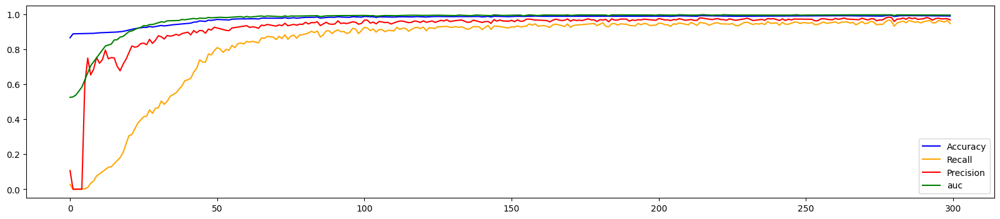

In [24]:
drawing(
    [history.history['accuracy'], 'Accuracy'],
    [history.history['recall'], 'Recall'],
    [history.history['precision'], 'Precision'],
    [history.history['auc'], 'auc']
)

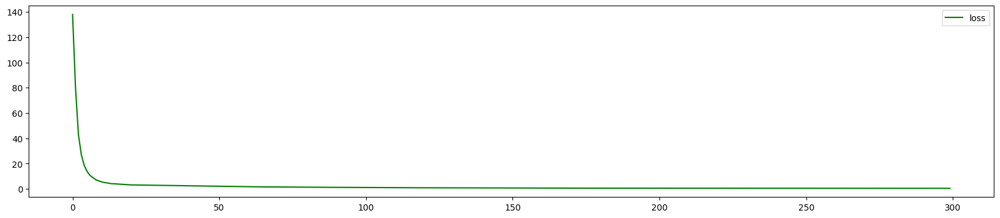

In [25]:
plt.plot(history.history['loss'],'green', label="loss")
plt.legend()

In [26]:
mo.evaluate(validation_dataset,batch_size = validation_dataset.batch_size ,steps = validation_dataset.n // validation_dataset.batch_size)

2/2 [==============================] - 33s 14s/step - loss: 0.5878 - tp: 119.0000 - fp: 6.0000 - tn: 1018.0000 - fn: 9.0000 - accuracy: 0.9870 - precision: 0.9520 - recall: 0.9297 - auc: 0.9897


[0.5878452658653259,
 119.0,
 6.0,
 1018.0,
 9.0,
 0.9869791865348816,
 0.9520000219345093,
 0.9296875,
 0.98974609375]

In [27]:
validation_dataset.reset()

In [28]:
Y_pred = mo.predict(validation_dataset,  workers=1)


3/3 [==============================] - 42s 11s/step


In [29]:
y_pred = np.argmax(Y_pred ,  axis = 1)


In [30]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 7, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 8, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 6, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 5, 5, 5, 5, 8, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 4, 7, 7, 8, 8, 8, 8, 8, 8, 4, 8,
       8, 8, 8, 8, 8, 8, 8, 8], dtype=int64)

In [31]:
validation_dataset.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7,
       7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8,
       8, 8, 8, 8, 8, 8, 8, 8])

In [32]:
len(y_pred)

162

In [33]:
len(validation_dataset.classes)


162

In [34]:
res = tf.math.confusion_matrix(y_pred,validation_dataset.classes).numpy()


In [35]:
confusion_matrix = pd.DataFrame(res,
                     index = classes_name,
                     columns = classes_name)

In [36]:
confusion_matrix

,Ajwa,Galaxy,Medjool,Meneifi,Nabtat Ali,Rutab,Shaishe,Sokari,Sugaey
Ajwa,17,0,0,0,0,0,0,0,0
Galaxy,0,18,0,0,0,0,0,0,0
Medjool,0,0,13,0,0,0,0,0,0
Meneifi,0,0,0,21,0,0,0,0,0
Nabtat Ali,0,0,0,0,17,0,0,1,1
Rutab,0,0,0,0,0,13,0,0,0
Shaishe,0,0,0,1,0,0,17,0,0
Sokari,0,1,0,0,0,0,0,25,0
Sugaey,0,0,0,1,0,1,0,0,15


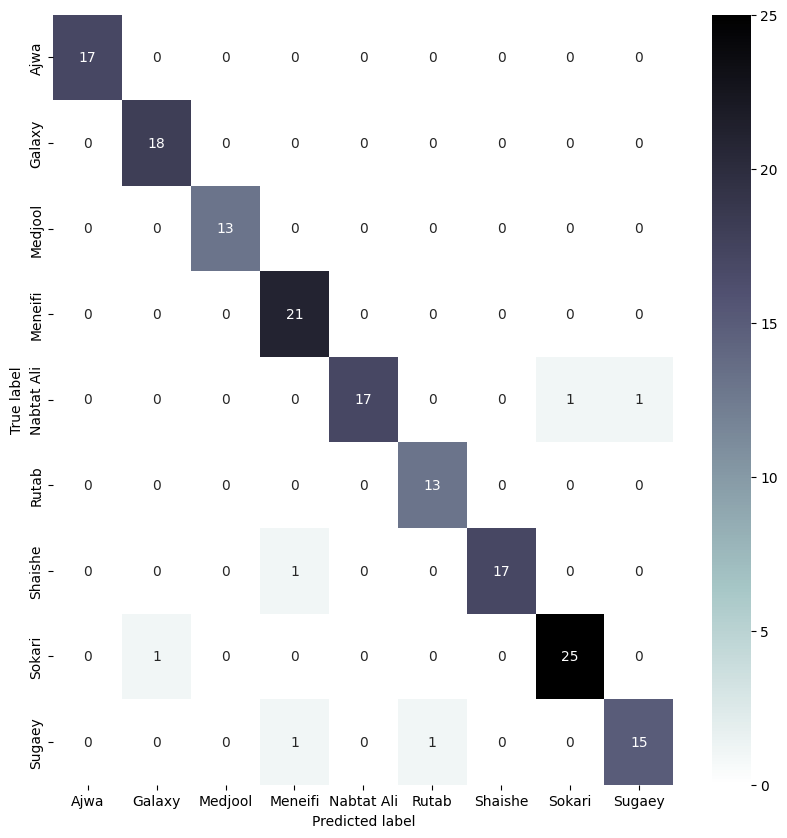

In [38]:
import seaborn as sns
mpl.style.use('fast')
figure = plt.figure(figsize=(10, 10))
sns.heatmap(confusion_matrix, annot=True, cmap=plt.cm.bone_r)
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [43]:
pip install scikit-learn

   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB ? eta -:--:--
   ---------------------------------------- 0.0/10.6 MB 262.6 kB/s eta 0:00:41
   ---------------------------------------- 0.0/10.6 MB 245.8 kB/s eta 0:00:44
   ---------------------------------------- 0.1/10.6 MB 435.7 kB/s eta 0:00:25
    --------------------------------------- 0.2/10.6 MB 610.0 kB/s eta 0:00:18
    --------------------------------------- 0.2/10.6 MB 692.9 kB/s eta 0:00:16
   - -------------------------------------- 0.3/10.6 MB 811.7 kB/s eta 0:00:13
   - -------------------------------------- 0.3/10.6 MB 819.2 kB/s eta 0:00:13
   - -------------------------------------- 0.4/10.6 MB 935.2 kB/s eta 0:00:11
   -- ------------------------------------- 0.6/10.6 MB 1.2 MB/s eta 0:00:09
   -- ------------------------------------- 0.7/10.6 MB 1.4 MB/s eta 0:00:08
   -

In [44]:
from sklearn.metrics import classification_report
classifi_report = classification_report(validation_dataset.classes, y_pred,target_names = classes_name)
print(classifi_report)

              precision    recall  f1-score   support

        Ajwa       1.00      1.00      1.00        17
      Galaxy       1.00      0.95      0.97        19
     Medjool       1.00      1.00      1.00        13
     Meneifi       1.00      0.91      0.95        23
  Nabtat Ali       0.89      1.00      0.94        17
       Rutab       1.00      0.93      0.96        14
     Shaishe       0.94      1.00      0.97        17
      Sokari       0.96      0.96      0.96        26
      Sugaey       0.88      0.94      0.91        16

    accuracy                           0.96       162
   macro avg       0.96      0.97      0.96       162
weighted avg       0.97      0.96      0.96       162



# Testing Model

In [7]:
model = tf.saved_model.load('/2nd Model/using tf')


In [8]:
image_path = 'MD.JPG'


In [9]:
# Function to preprocess the image
def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.resize(img, (448, 448))  # Resize the image to match model's input shape
    img = img.astype(np.float32) / 255.0  # Convert to float32 and normalize
    return img.reshape(1, 448, 448, 3)  # Reshape for model input


In [10]:
# Function to predict date type
def predict_date_type(image_path, model):
    preprocessed_image = preprocess_image(image_path)  # Only pass image_path
    prediction = model(preprocessed_image)  # Calling the loaded model directly
    predicted_class = np.argmax(prediction)
    print('Prediction: ',prediction)
    confidence = prediction[0][predicted_class]
    return predicted_class, confidence


In [11]:
classes_name = ['Ajwa', 'Galaxy', 'Medjool', 'Meneifi', 'Nabtat Ali', 'Rutab', 'Shaishe', 'Sokari', 'Sugaey']


In [12]:
image_path = 'MD.JPG'
predicted_class, confidence = predict_date_type(image_path, model)
print("Predicted Date Types:", classes_name[predicted_class])
print("Confidence:", confidence)

Prediction:  tf.Tensor(
[[5.3211892e-01 1.5796451e-03 1.9318735e-03 1.2864126e-04 3.8891476e-01
  2.0160555e-04 1.8644482e-02 2.0174433e-03 5.4462586e-02]], shape=(1, 9), dtype=float32)
Predicted Date Types: Ajwa
Confidence: tf.Tensor(0.5321189, shape=(), dtype=float32)
